In [74]:
import matplotlib.pyplot as plt
import torch
import torchvision

from torch import nn
from torchvision import transforms
from helper_functions import set_seeds

In [75]:
device = "cuda" if torch.cuda.is_available() else "cpu"
device

'cpu'

In [76]:
# 1. Get pretrained weights for ViT-Base
pretrained_vit_weights = torchvision.models.ViT_B_16_Weights.DEFAULT 

# 2. Setup a ViT model instance with pretrained weights
pretrained_vit = torchvision.models.vit_b_16(weights=pretrained_vit_weights).to(device)

# 3. Freeze the base parameters
for parameter in pretrained_vit.parameters():
    parameter.requires_grad = False
    
# 4. Change the classifier head 
class_names = ['Black Spot', 'Downly Mildew', 'Fresh Leaf']

set_seeds()
pretrained_vit.heads = nn.Linear(in_features=768, out_features=len(class_names)).to(device)
# pretrained_vit # uncomment for model output 

In [77]:
from torchinfo import summary

# Print a summary using torchinfo (uncomment for actual output)
summary(model=pretrained_vit, 
        input_size=(32, 3, 224, 224), # (batch_size, color_channels, height, width)
        # col_names=["input_size"], # uncomment for smaller output
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"]
)

Layer (type (var_name))                                      Input Shape          Output Shape         Param #              Trainable
VisionTransformer (VisionTransformer)                        [32, 3, 224, 224]    [32, 3]              768                  Partial
├─Conv2d (conv_proj)                                         [32, 3, 224, 224]    [32, 768, 14, 14]    (590,592)            False
├─Encoder (encoder)                                          [32, 197, 768]       [32, 197, 768]       151,296              False
│    └─Dropout (dropout)                                     [32, 197, 768]       [32, 197, 768]       --                   --
│    └─Sequential (layers)                                   [32, 197, 768]       [32, 197, 768]       --                   False
│    │    └─EncoderBlock (encoder_layer_0)                   [32, 197, 768]       [32, 197, 768]       (7,087,872)          False
│    │    └─EncoderBlock (encoder_layer_1)                   [32, 197, 768]       [32, 

#### Notice how only the output layer is trainable, where as, all of the rest of the layers are untrainable (frozen).

In [78]:
# Setup directory paths to train and test images
train_dir = 'F:/ADITYA SIR/ROSE/train'
test_dir = 'F:/ADITYA SIR/ROSE/test'

Remember, if you're going to use a pretrained model, it's generally important to ensure your own custom data is transformed/formatted in the same way the data the original model was trained on.

In [79]:
# Get automatic transforms from pretrained ViT weights
pretrained_vit_transforms = pretrained_vit_weights.transforms()
print(pretrained_vit_transforms)

ImageClassification(
    crop_size=[224]
    resize_size=[256]
    mean=[0.485, 0.456, 0.406]
    std=[0.229, 0.224, 0.225]
    interpolation=InterpolationMode.BILINEAR
)


## And now we've got transforms ready, we can turn our images into DataLoaders using the create_dataloaders()

In [80]:
import os

from torchvision import datasets, transforms
from torch.utils.data import DataLoader

NUM_WORKERS = os.cpu_count()

def create_dataloaders(
    train_dir: str, 
    test_dir: str, 
    transform: transforms.Compose, 
    batch_size: int, 
    num_workers: int=NUM_WORKERS
):

  # Use ImageFolder to create dataset(s)
  train_data = datasets.ImageFolder(train_dir, transform=transform)
  test_data = datasets.ImageFolder(test_dir, transform=transform)

  # Get class names
  class_names = train_data.classes

  # Turn images into data loaders
  train_dataloader = DataLoader(
      train_data,
      batch_size=batch_size,
      shuffle=True,
      num_workers=num_workers,
      pin_memory=True,
  )
  test_dataloader = DataLoader(
      test_data,
      batch_size=batch_size,
      shuffle=False,
      num_workers=num_workers,
      pin_memory=True,
  )

  return train_dataloader, test_dataloader, class_names

In [81]:
# Setup dataloaders
train_dataloader_pretrained, test_dataloader_pretrained, class_names = create_dataloaders(train_dir=train_dir,
                                                                                                     test_dir=test_dir,
                                                                                                     transform=pretrained_vit_transforms,
                                                                                                     batch_size=32) # Could increase if we had more samples, such as here: https://arxiv.org/abs/2205.01580 (there are other improvements there too...)


In [9]:
from going_modular.going_modular import engine

# Create optimizer and loss function
optimizer = torch.optim.Adam(params=pretrained_vit.parameters(), 
                             lr=1e-3)
loss_fn = torch.nn.CrossEntropyLoss()

# Train the classifier head of the pretrained ViT feature extractor model
set_seeds()
pretrained_vit_results = engine.train(model=pretrained_vit,
                                      train_dataloader=train_dataloader_pretrained,
                                      test_dataloader=test_dataloader_pretrained,
                                      optimizer=optimizer,
                                      loss_fn=loss_fn,
                                      epochs=30,
                                      device=device)

  0%|          | 0/30 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.2997 | train_acc: 0.9229 | test_loss: 0.1657 | test_acc: 0.9699
Epoch: 2 | train_loss: 0.1036 | train_acc: 0.9799 | test_loss: 0.1062 | test_acc: 0.9810
Epoch: 3 | train_loss: 0.0699 | train_acc: 0.9880 | test_loss: 0.0714 | test_acc: 0.9888
Epoch: 4 | train_loss: 0.0537 | train_acc: 0.9914 | test_loss: 0.0653 | test_acc: 0.9866
Epoch: 5 | train_loss: 0.0433 | train_acc: 0.9940 | test_loss: 0.0502 | test_acc: 0.9911
Epoch: 6 | train_loss: 0.0362 | train_acc: 0.9946 | test_loss: 0.0454 | test_acc: 0.9911
Epoch: 7 | train_loss: 0.0305 | train_acc: 0.9960 | test_loss: 0.0450 | test_acc: 0.9911
Epoch: 8 | train_loss: 0.0262 | train_acc: 0.9971 | test_loss: 0.0380 | test_acc: 0.9922
Epoch: 9 | train_loss: 0.0236 | train_acc: 0.9974 | test_loss: 0.0339 | test_acc: 0.9933
Epoch: 10 | train_loss: 0.0207 | train_acc: 0.9980 | test_loss: 0.0335 | test_acc: 0.9922
Epoch: 11 | train_loss: 0.0186 | train_acc: 0.9980 | test_loss: 0.0350 | test_acc: 0.9911
Epoch: 12 | train_l

pretrained ViT performed far better than our custom ViT model trained from scratch (in the same amount of time).


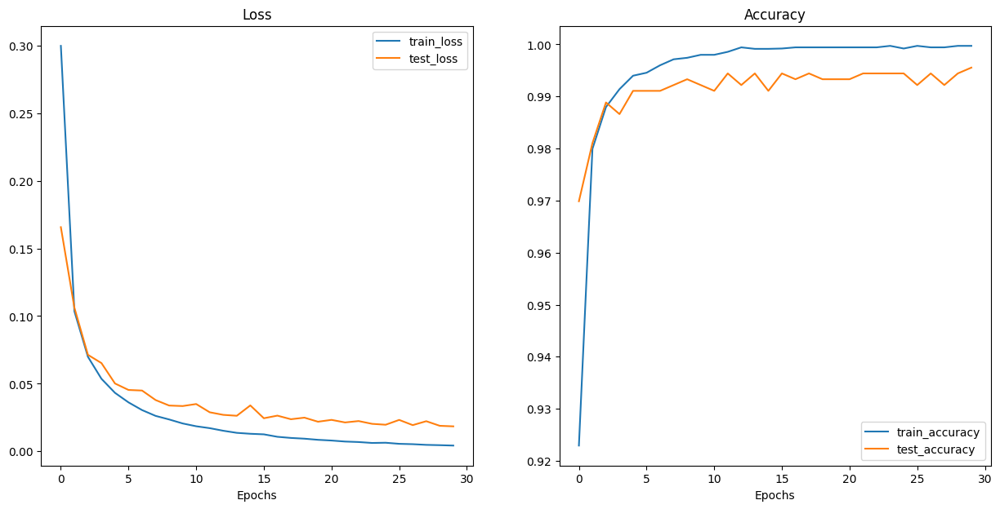

In [23]:
# Plot the loss curves
from helper_functions import plot_loss_curves

plot_loss_curves(pretrained_vit_results) 

## That's the power of transfer learning!

We managed to get outstanding results with the same model architecture, except our custom implementation was trained from scratch (worse performance) and this feature extractor model has the power of pretrained weights from ImageNet behind it.

# Let's make Prediction:

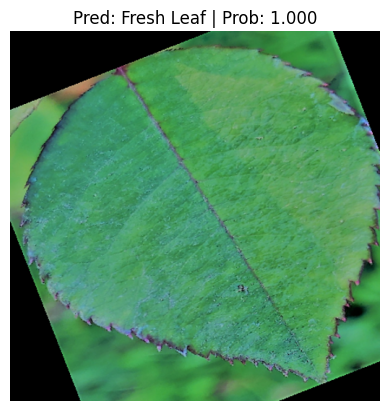

In [26]:
import requests

# Import function to make predictions on images and plot them 
from going_modular.going_modular.predictions import pred_and_plot_image

# Setup custom image path
custom_image_path = "3.png"

# Predict on custom image
pred_and_plot_image(model=pretrained_vit,
                    image_path=custom_image_path,
                    class_names=class_names)

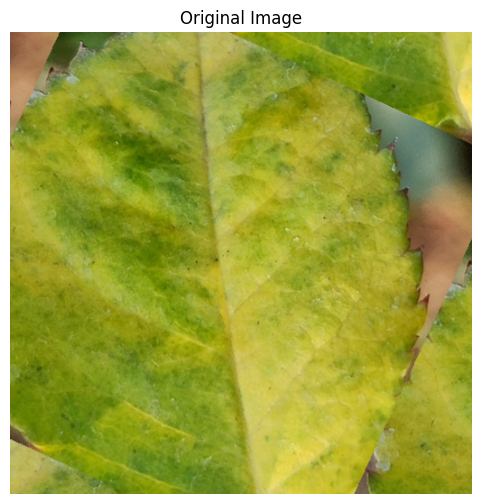

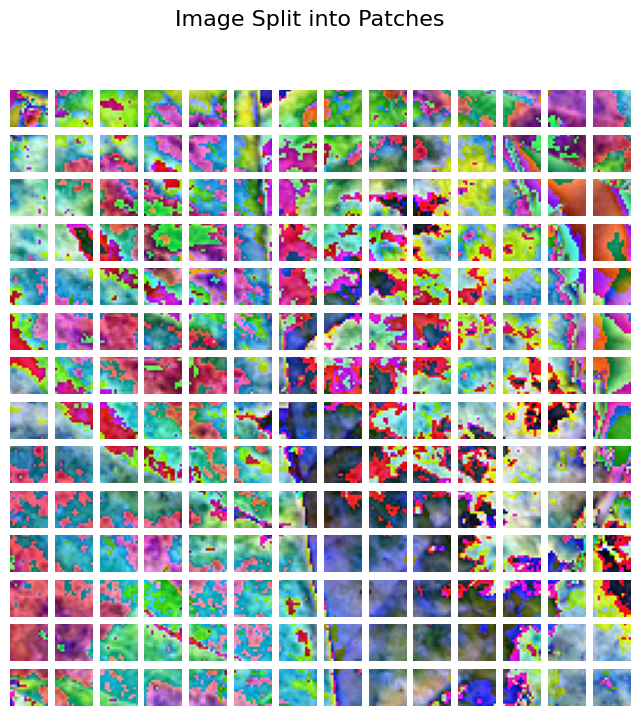

Predicted class: Downy Mildew


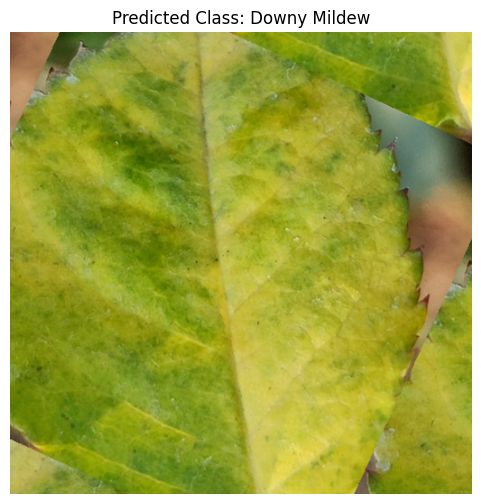

In [27]:
import torch
import matplotlib.pyplot as plt
from torchvision import transforms
from PIL import Image
import numpy as np

# Load a custom image
custom_image_path = "2.png"
image = Image.open(custom_image_path)

# Display the original image
plt.figure(figsize=(6, 6))
plt.imshow(image)
plt.title("Original Image")
plt.axis('off')
plt.show()

# Step 1: Transform the image to match ViT input requirements
pretrained_vit_transforms = pretrained_vit_weights.transforms()
transformed_image = pretrained_vit_transforms(image).unsqueeze(0).to(device)  # Add batch dimension

# Step 2: Visualize image patches (ViT splits image into 16x16 patches)
def show_image_patches(image_tensor, patch_size=16):
    # Convert the tensor back to a NumPy array for visualization
    image_np = image_tensor.squeeze(0).cpu().numpy().transpose(1, 2, 0)  # Remove batch dim and re-order channels
    height, width, _ = image_np.shape

    # Rescale pixel values back to 0-255 range
    image_np = (image_np * 255).astype(np.uint8)

    # Calculate number of patches
    num_patches_x = width // patch_size
    num_patches_y = height // patch_size

    # Create figure
    fig, ax = plt.subplots(num_patches_y, num_patches_x, figsize=(8, 8))

    for i in range(num_patches_y):
        for j in range(num_patches_x):
            patch = image_np[i * patch_size:(i + 1) * patch_size, j * patch_size:(j + 1) * patch_size, :]
            ax[i, j].imshow(patch)
            ax[i, j].axis('off')

    plt.suptitle("Image Split into Patches", fontsize=16)
    plt.show()

# Show the image divided into 16x16 patches
show_image_patches(image_tensor=transformed_image, patch_size=16)

# Step 3: Feed the transformed image through the Vision Transformer
pretrained_vit.eval()  # Set model to evaluation mode
with torch.no_grad():
    # Get the prediction for the image
    output = pretrained_vit(transformed_image)

# Step 4: Visualize the classification result
predicted_class_idx = torch.argmax(output, dim=1).item()
predicted_class = class_names[predicted_class_idx]

print(f"Predicted class: {predicted_class}")

# Step 5: Plot the original image with the predicted label
plt.figure(figsize=(6, 6))
plt.imshow(image)
plt.title(f"Predicted Class: {predicted_class}")
plt.axis('off')
plt.show()


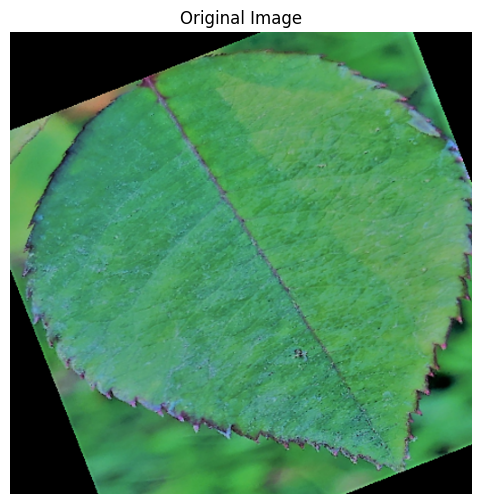

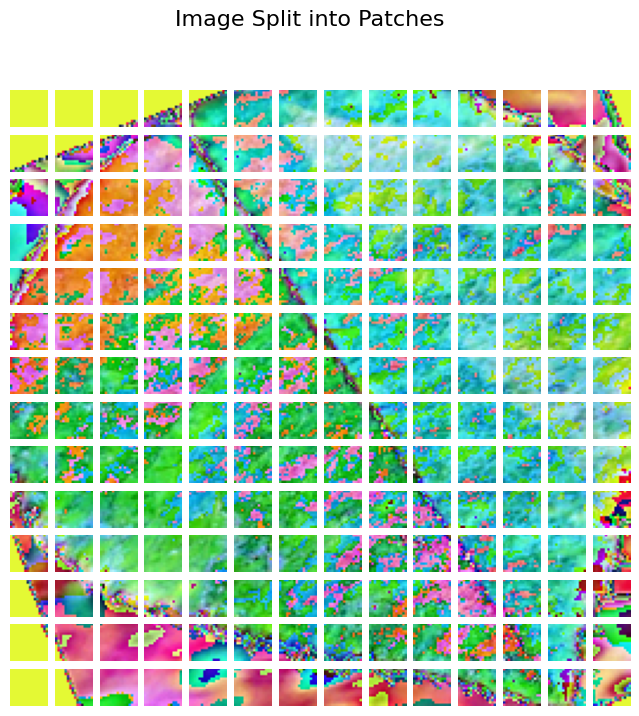

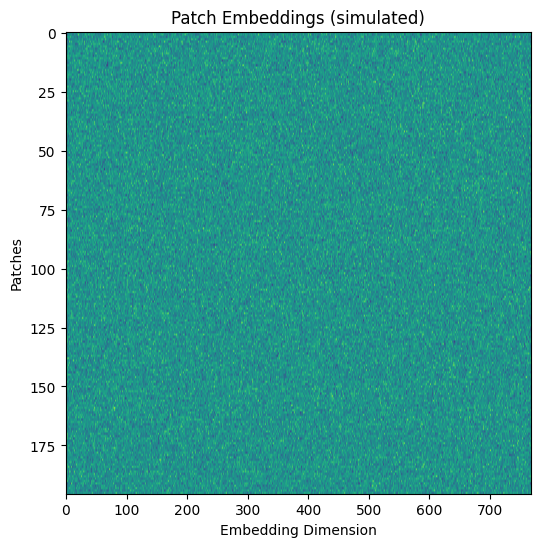

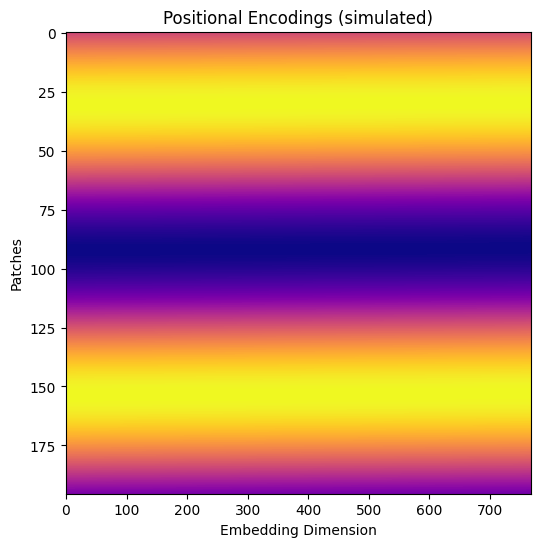

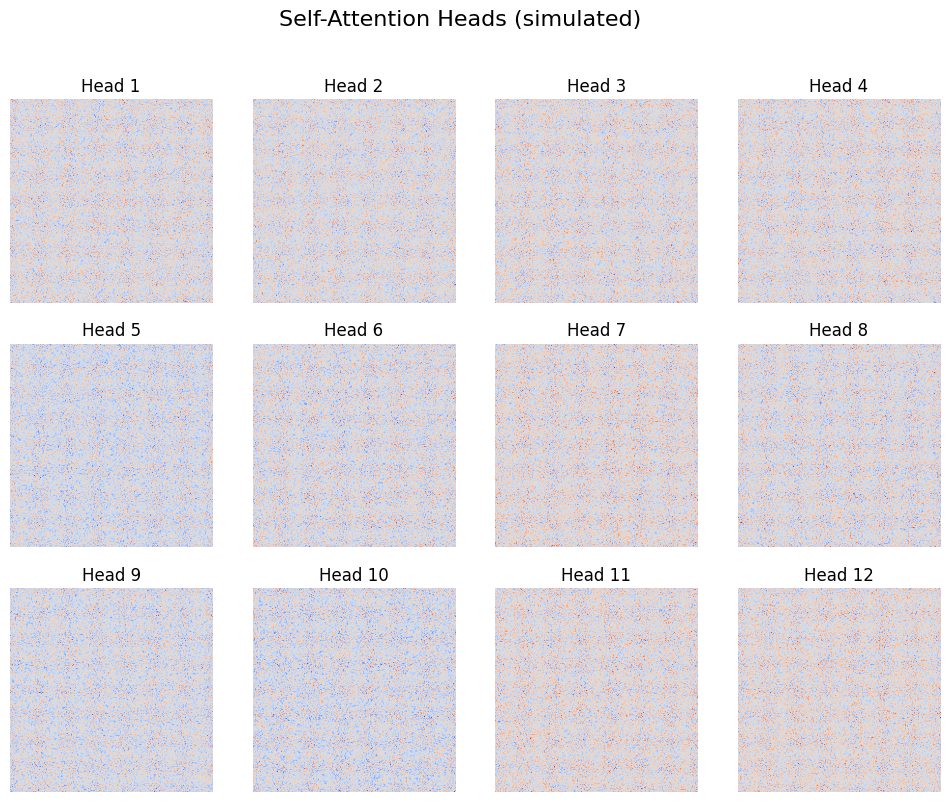

IndexError: list index out of range

In [72]:
import torch
import matplotlib.pyplot as plt
from torchvision import transforms
from PIL import Image
import numpy as np

# Load a custom image
custom_image_path = "3.png"
image = Image.open(custom_image_path)

# Display the original image
plt.figure(figsize=(6, 6))
plt.imshow(image)
plt.title("Original Image")
plt.axis('off')
plt.show()

# Step 1: Transform the image to match ViT input requirements
pretrained_vit_transforms = pretrained_vit_weights.transforms()
transformed_image = pretrained_vit_transforms(image).unsqueeze(0).to(device)  # Add batch dimension

# Step 2: Show the image patches
def show_image_patches(image_tensor, patch_size=16):
    # Convert the tensor back to a NumPy array for visualization
    image_np = image_tensor.squeeze(0).cpu().numpy().transpose(1, 2, 0)  # Remove batch dim and re-order channels
    height, width, _ = image_np.shape

    # Rescale pixel values back to 0-255 range
    image_np = (image_np * 255).astype(np.uint8)

    # Calculate number of patches
    num_patches_x = width // patch_size
    num_patches_y = height // patch_size

    # Create figure
    fig, ax = plt.subplots(num_patches_y, num_patches_x, figsize=(8, 8))

    for i in range(num_patches_y):
        for j in range(num_patches_x):
            patch = image_np[i * patch_size:(i + 1) * patch_size, j * patch_size:(j + 1) * patch_size, :]
            ax[i, j].imshow(patch)
            ax[i, j].axis('off')

    plt.suptitle("Image Split into Patches", fontsize=16)
    plt.show()

# Show the image divided into 16x16 patches
show_image_patches(image_tensor=transformed_image, patch_size=16)

# Step 3: Show patch embedding process
# Visualize patches as linear embeddings
def show_patch_embeddings(image_tensor, patch_size=16, embed_dim=768):
    num_patches = (image_tensor.shape[-1] // patch_size) ** 2
    fig, ax = plt.subplots(1, 1, figsize=(6, 6))
    
    # Create random embeddings to simulate the step
    patch_embeddings = np.random.randn(num_patches, embed_dim)

    # Visualizing the embeddings as a heatmap
    ax.imshow(patch_embeddings, cmap='viridis', aspect='auto')
    ax.set_title("Patch Embeddings (simulated)")
    plt.xlabel("Embedding Dimension")
    plt.ylabel("Patches")
    plt.show()

# Show simulated patch embeddings
show_patch_embeddings(image_tensor=transformed_image, patch_size=16)

# Step 4: Add positional encodings to the embeddings (simulate)
def show_positional_encodings(patch_size=16, embed_dim=768, num_patches=196):
    # Simulating positional encodings as sinusoidal functions
    positional_encodings = np.sin(np.linspace(0, 10, num_patches * embed_dim)).reshape(num_patches, embed_dim)

    # Plotting the positional encodings as heatmap
    plt.figure(figsize=(6, 6))
    plt.imshow(positional_encodings, cmap='plasma', aspect='auto')
    plt.title("Positional Encodings (simulated)")
    plt.xlabel("Embedding Dimension")
    plt.ylabel("Patches")
    plt.show()

# Show positional encodings (simulated)
show_positional_encodings()

# Step 5: Process image through the transformer layers
# Visualize a generic self-attention process (simulated)
def show_attention_heads(num_heads=12, num_patches=196):
    # Simulating attention as random weights between patches
    attention_weights = np.random.randn(num_heads, num_patches, num_patches)

    fig, ax = plt.subplots(3, 4, figsize=(12, 9))  # 12 heads, arranged in 3x4 grid
    fig.suptitle("Self-Attention Heads (simulated)", fontsize=16)

    for i in range(3):
        for j in range(4):
            ax[i, j].imshow(attention_weights[i * 4 + j], cmap='coolwarm', aspect='auto')
            ax[i, j].axis('off')
            ax[i, j].set_title(f"Head {i * 4 + j + 1}")

    plt.show()

# Show simulated self-attention heads
show_attention_heads()

# Step 6: Predict the class for the image
pretrained_vit.eval()  # Set model to evaluation mode
with torch.no_grad():
    # Get the prediction for the image
    output = pretrained_vit(transformed_image)

# Step 7: Visualize the final predicted class
predicted_class_idx = torch.argmax(output, dim=1).item()
predicted_class = class_names[predicted_class_idx]

plt.figure(figsize=(6, 6))
plt.imshow(image)
plt.title(f"Predicted Class: {predicted_class}")
plt.axis('off')
plt.show()


In [29]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, roc_curve, roc_auc_score
import numpy as np
import torch


In [30]:
def get_predictions_and_labels(dataloader, model, device):
    model.eval()
    all_preds = []
    all_labels = []
    all_probs = []
    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            preds = torch.argmax(outputs, dim=1).cpu().numpy()
            all_preds.extend(preds)
            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(probs)
    return np.array(all_labels), np.array(all_preds), np.array(all_probs)


In [32]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

def plot_confusion_matrix(y_true, y_pred, class_names):
    # Compute confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    
    # Create a DataFrame for better visualization
    cm_df = pd.DataFrame(cm, index=class_names, columns=class_names)
    
    plt.figure(figsize=(10, 7))
    sns.heatmap(cm_df, annot=True, fmt='d', cmap='Blues', cbar=False, 
                xticklabels=class_names, yticklabels=class_names)
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.title('Confusion Matrix')
    plt.show()


In [33]:
import numpy as np
import torch

def get_predictions_and_labels(dataloader, model, device):
    model.eval()  # Set the model to evaluation mode
    y_true = []
    y_pred = []
    y_probs = []
    
    with torch.no_grad():
        for images, labels in dataloader:
            images, labels = images.to(device), labels.to(device)
            
            outputs = model(images)
            probabilities = torch.softmax(outputs, dim=1)
            predictions = torch.argmax(outputs, dim=1)
            
            y_true.extend(labels.cpu().numpy())
            y_pred.extend(predictions.cpu().numpy())
            y_probs.extend(probabilities[:, 1].cpu().numpy())  # Probabilities for the positive class
    
    return np.array(y_true), np.array(y_pred), np.array(y_probs)


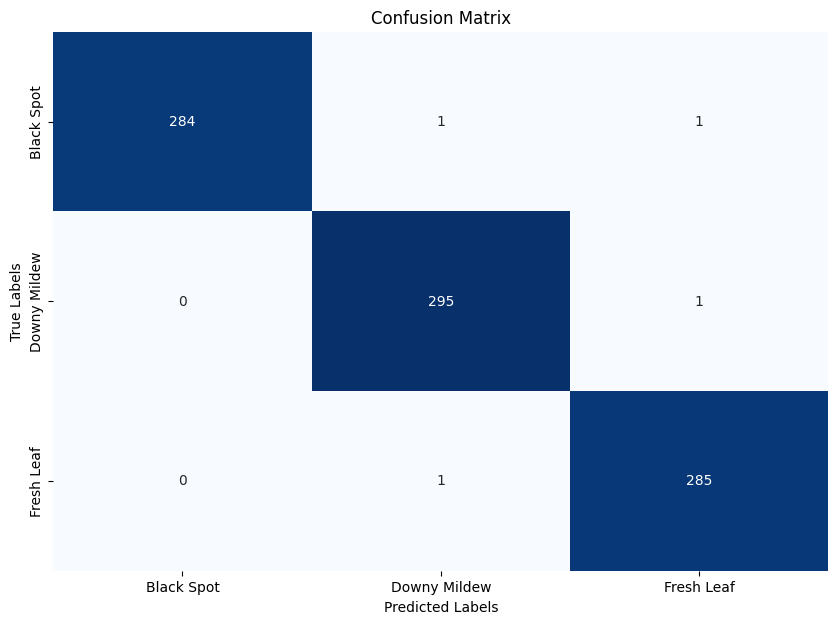

In [34]:
# Get predictions and true labels
y_true, y_pred, y_probs = get_predictions_and_labels(test_dataloader_pretrained, pretrained_vit, device)

# Plot Confusion Matrix
plot_confusion_matrix(y_true, y_pred, class_names)



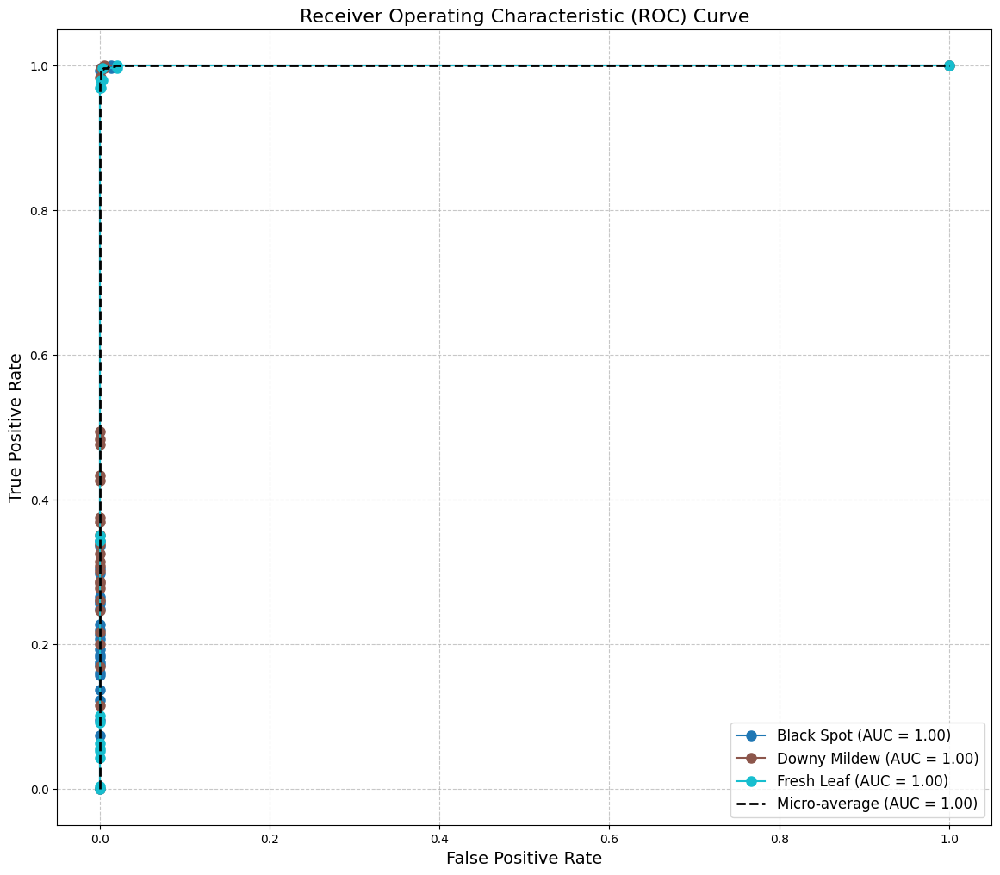

ROC AUC for each class:
Black Spot: 1.00
Downy Mildew: 1.00
Fresh Leaf: 1.00
Micro-average ROC AUC: 1.00


In [48]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

# Convert labels to binary format
n_classes = len(class_names)
y_bin = label_binarize(labels, classes=range(n_classes))
y_score = preds

# Initialize dictionaries for ROC curve data
fpr = {}
tpr = {}
roc_auc = {}

# Compute ROC curve and ROC AUC for each class
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute micro-average ROC curve and ROC AUC
fpr["micro"], tpr["micro"], _ = roc_curve(y_bin.ravel(), y_score.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

# Plot ROC curves
plt.figure(figsize=(14, 12))

# Plot ROC curve for each class with distinct colors and markers
colors = plt.cm.tab10(np.linspace(0, 1, n_classes))  # Use distinct colors for each class
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], color=colors[i], linestyle='-', marker='o', markersize=8,
             label=f'{class_names[i]} (AUC = {roc_auc[i]:.2f})')

# Plot micro-average ROC curve
plt.plot(fpr["micro"], tpr["micro"], color='black', linestyle='--', linewidth=2, 
         label=f'Micro-average (AUC = {roc_auc["micro"]:.2f})')

# Enhance the plot with grid, title, and labels
plt.xlabel('False Positive Rate', fontsize=14)
plt.ylabel('True Positive Rate', fontsize=14)
plt.title('Receiver Operating Characteristic (ROC) Curve', fontsize=16)
plt.legend(loc='best', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)
plt.show()

# Print ROC AUC for each class and micro-average
print('ROC AUC for each class:')
for i in range(n_classes):
    print(f'{class_names[i]}: {roc_auc[i]:.2f}')

print(f'Micro-average ROC AUC: {roc_auc["micro"]:.2f}')


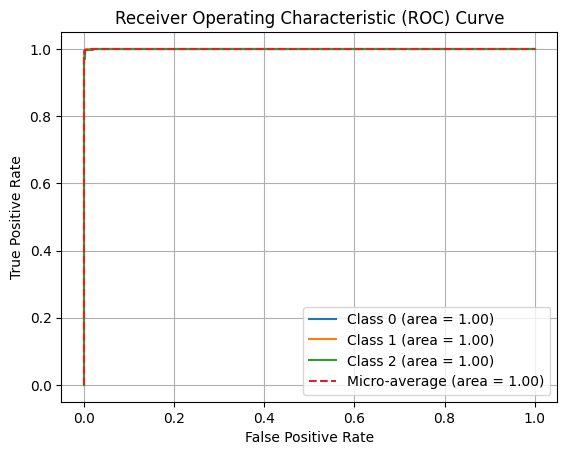

In [40]:
import matplotlib.pyplot as plt

plt.figure()

# Plot ROC curves for each class
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label=f'Class {i} (area = {roc_auc[i]:.2f})')

# Plot micro-average ROC curve
plt.plot(fpr["micro"], tpr["micro"], label=f'Micro-average (area = {roc_auc["micro"]:.2f})', linestyle='--')

plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='best')
plt.grid(True)
plt.show()


In [41]:
from sklearn.metrics import classification_report, confusion_matrix, precision_score, recall_score, f1_score
import seaborn as sns
import pandas as pd



Classification Report:
{'Black Spot': {'precision': 1.0, 'recall': 0.993006993006993, 'f1-score': 0.9964912280701755, 'support': 286}, 'Downy Mildew': {'precision': 0.9932659932659933, 'recall': 0.9966216216216216, 'f1-score': 0.9949409780775715, 'support': 296}, 'Fresh Leaf': {'precision': 0.9930313588850174, 'recall': 0.9965034965034965, 'f1-score': 0.9947643979057592, 'support': 286}, 'accuracy': 0.9953917050691244, 'macro avg': {'precision': 0.9954324507170035, 'recall': 0.9953773703773704, 'f1-score': 0.9953988680178355, 'support': 868}, 'weighted avg': {'precision': 0.9954074915297799, 'recall': 0.9953917050691244, 'f1-score': 0.9953935927881089, 'support': 868}}


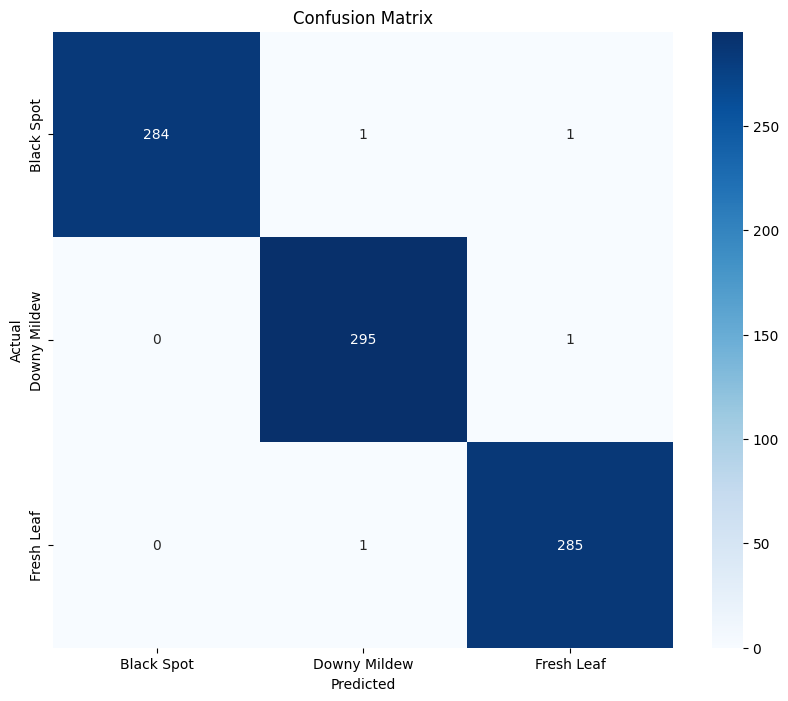

In [42]:
def compute_metrics(preds, labels, class_names):
    # Convert predictions to class indices
    pred_classes = np.argmax(preds, axis=1)

    # Compute classification report
    report = classification_report(labels, pred_classes, target_names=class_names, output_dict=True)

    # Compute confusion matrix
    conf_matrix = confusion_matrix(labels, pred_classes)

    # Convert confusion matrix to DataFrame for better visualization
    conf_matrix_df = pd.DataFrame(conf_matrix, index=class_names, columns=class_names)

    return report, conf_matrix_df

# Compute metrics
report, conf_matrix_df = compute_metrics(preds, labels, class_names)

# Print classification report
print("Classification Report:")
print(report)

# Plot confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix_df, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()


In [43]:
# Extract specific metrics from classification report
def extract_metrics(report):
    metrics = {
        'Precision': {class_name: report[class_name]['precision'] for class_name in class_names},
        'Recall': {class_name: report[class_name]['recall'] for class_name in class_names},
        'F1-Score': {class_name: report[class_name]['f1-score'] for class_name in class_names},
        'Support': {class_name: report[class_name]['support'] for class_name in class_names}
    }
    return metrics

# Get detailed metrics
metrics = extract_metrics(report)

# Print detailed metrics
print("\nDetailed Metrics:")
for metric_name, metric_values in metrics.items():
    print(f"{metric_name}:")
    for class_name, value in metric_values.items():
        print(f"  {class_name}: {value:.4f}")



Detailed Metrics:
Precision:
  Black Spot: 1.0000
  Downy Mildew: 0.9933
  Fresh Leaf: 0.9930
Recall:
  Black Spot: 0.9930
  Downy Mildew: 0.9966
  Fresh Leaf: 0.9965
F1-Score:
  Black Spot: 0.9965
  Downy Mildew: 0.9949
  Fresh Leaf: 0.9948
Support:
  Black Spot: 286.0000
  Downy Mildew: 296.0000
  Fresh Leaf: 286.0000


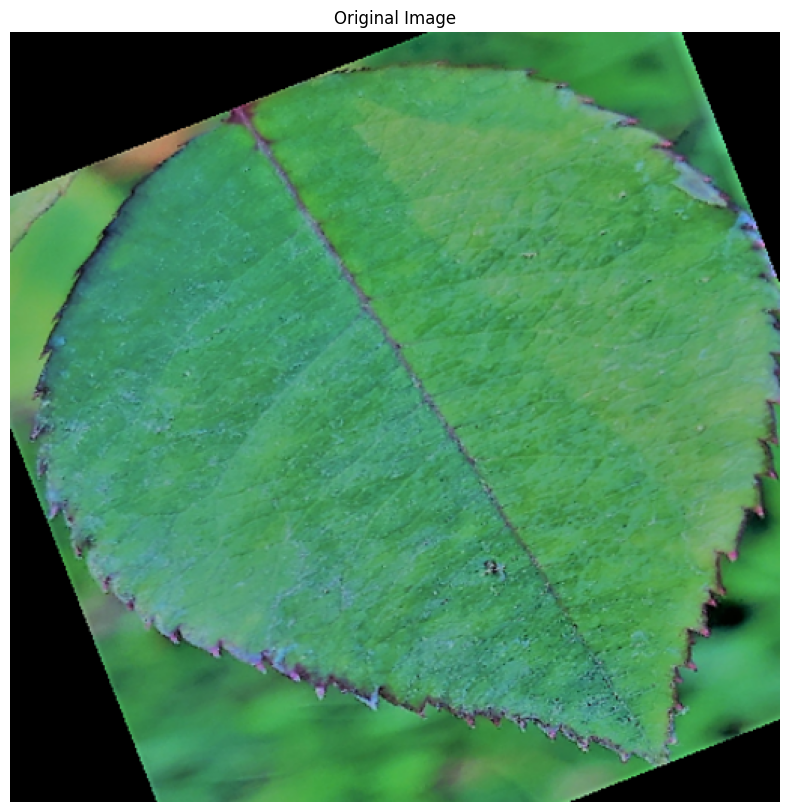

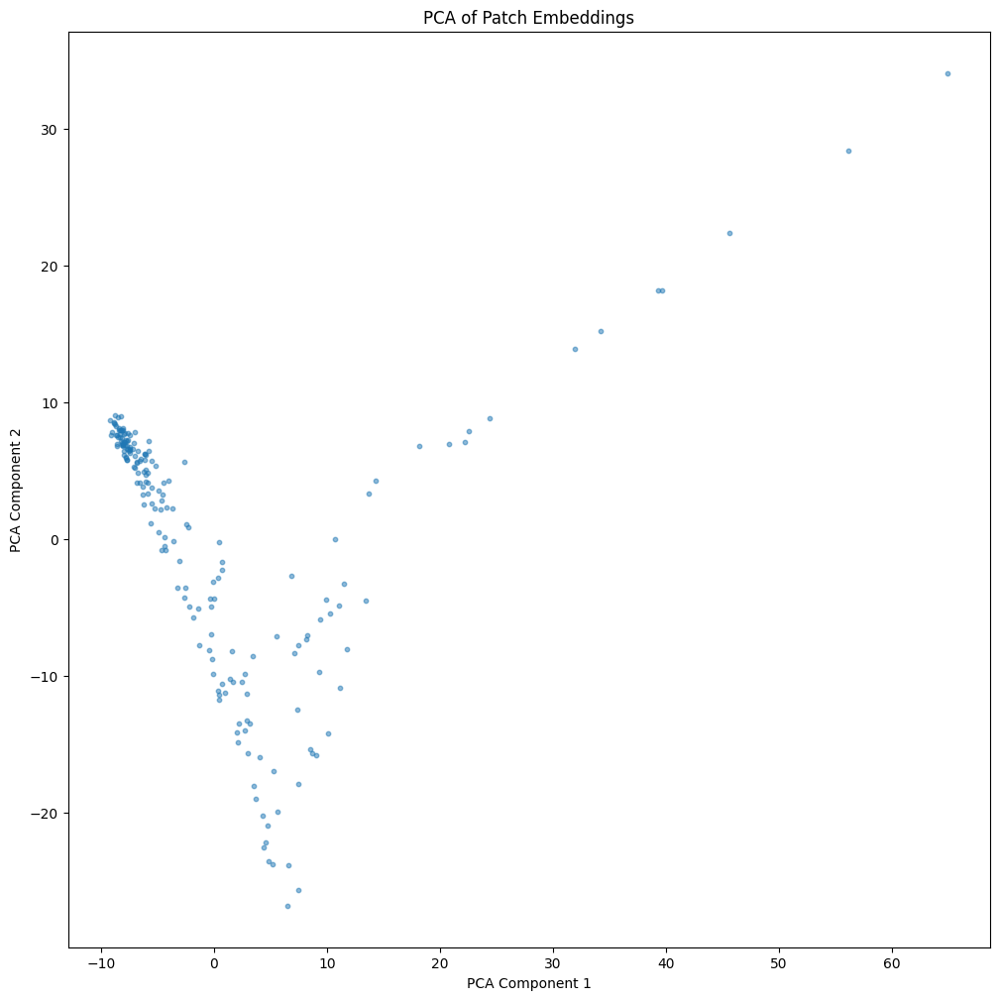

In [60]:
import torch
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
from torchvision import transforms
from torchvision.models import vit_b_16
from sklearn.decomposition import PCA

# Define a class to hold hook functionality
class ViTHook:
    def __init__(self, model):
        self.model = model
        self.hooks = []
        self.hidden_states = None

    def hook(self):
        def hook_fn(module, input, output):
            self.hidden_states = output
        # Register hook on the final layer output (before classification head)
        self.hooks.append(self.model.encoder.layers[-1].register_forward_hook(hook_fn))

    def remove_hooks(self):
        for hook in self.hooks:
            hook.remove()

    def get_hidden_states(self):
        return self.hidden_states

def get_patch_embeddings(model, input_image):
    hooker = ViTHook(model)
    hooker.hook()
    model.eval()
    with torch.no_grad():
        outputs = model(input_image)
    patch_embeddings = hooker.get_hidden_states().detach().cpu().numpy()
    hooker.remove_hooks()
    return patch_embeddings

def visualize_vit_steps(model, image_path, preprocess, device):
    # Load and preprocess the image
    image = Image.open(image_path).convert('RGB')
    input_image = preprocess(image).unsqueeze(0).to(device)
    
    # Show original image
    plt.figure(figsize=(10, 10))
    plt.imshow(image)
    plt.title("Original Image")
    plt.axis('off')
    plt.show()

    # Get patch embeddings from the model
    patch_embeddings = get_patch_embeddings(model, input_image)
    
    # Visualize patch embeddings using PCA
    if patch_embeddings is not None:
        num_patches = patch_embeddings.shape[1]
        embedding_dim = patch_embeddings.shape[2]
        
        # Flatten embeddings for PCA
        flat_embeddings = patch_embeddings.reshape(-1, embedding_dim)
        
        # Reduce dimensionality to 2D for visualization
        pca = PCA(n_components=2)
        reduced_embeddings = pca.fit_transform(flat_embeddings)
        
        # Plot the PCA results
        plt.figure(figsize=(12, 12))
        plt.scatter(reduced_embeddings[:, 0], reduced_embeddings[:, 1], alpha=0.5, s=10)
        plt.title('PCA of Patch Embeddings')
        plt.xlabel('PCA Component 1')
        plt.ylabel('PCA Component 2')
        plt.show()

# Example usage:
custom_image_path = "3.png"
preprocess = transforms.Compose([
    transforms.Resize((224, 224)),  # Adjust size based on your ViT model
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Pretrained model normalization
])

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
pretrained_vit = vit_b_16(pretrained=True).to(device)  # Replace with your model
visualize_vit_steps(model=pretrained_vit, image_path=custom_image_path, preprocess=preprocess, device=device)


C:\Users\ARIF\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\ARIF\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ViT_B_16_Weights.IMAGENET1K_V1`. You can also use `weights=ViT_B_16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


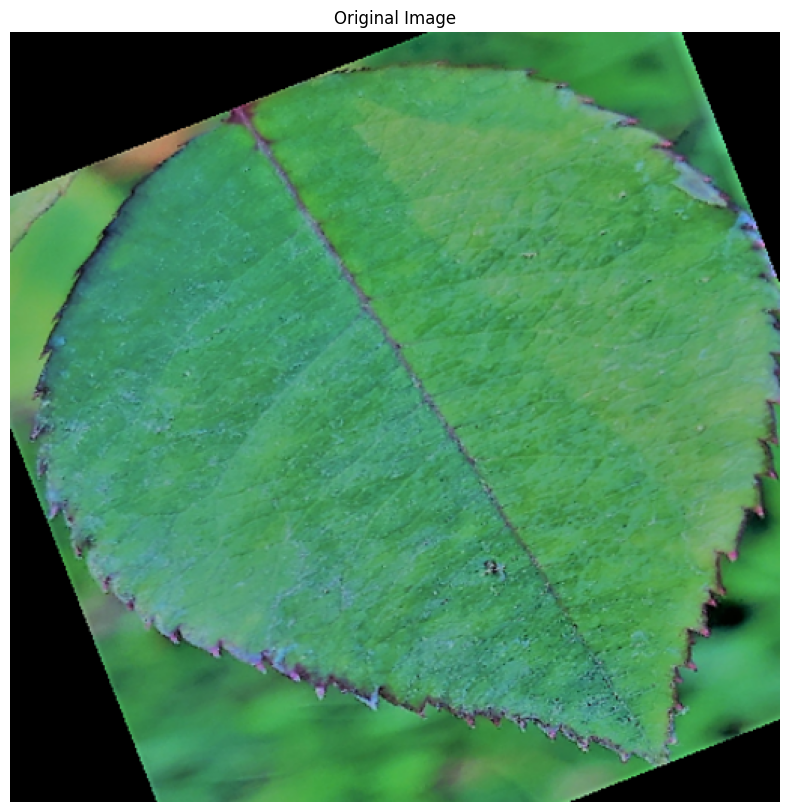

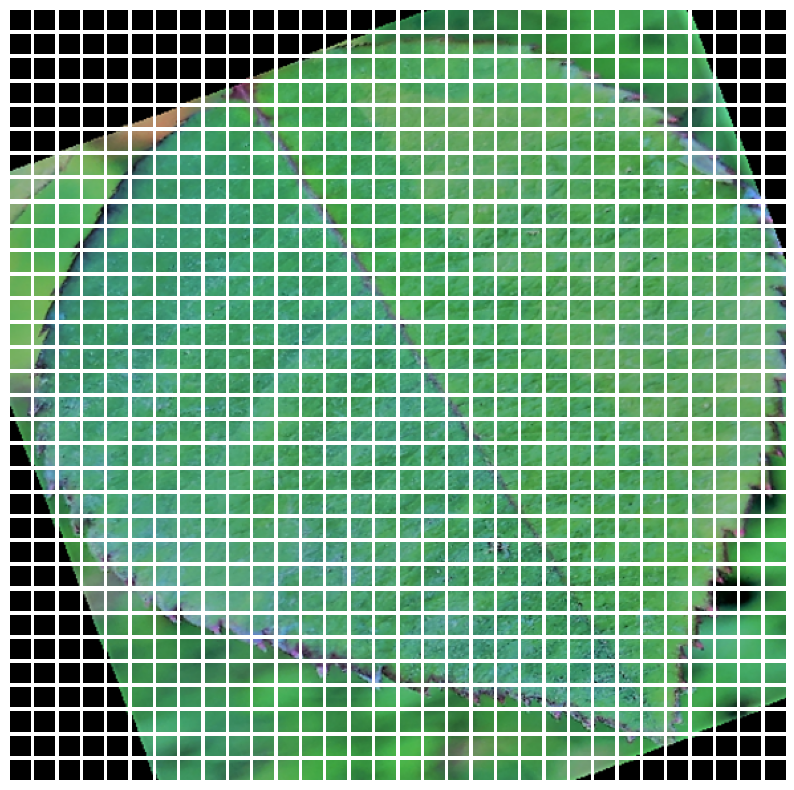

In [61]:
import torch
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
from torchvision import transforms
from torchvision.models import vit_b_16

def extract_patches(image, patch_size):
    """Extract patches from the image."""
    image = np.array(image)
    patches = []
    for i in range(0, image.shape[0], patch_size):
        for j in range(0, image.shape[1], patch_size):
            patch = image[i:i + patch_size, j:j + patch_size]
            if patch.shape[0] == patch_size and patch.shape[1] == patch_size:
                patches.append(patch)
    return patches

def visualize_patches(patches, patch_size, image_size):
    """Visualize the extracted patches."""
    num_patches = len(patches)
    grid_size = int(np.ceil(np.sqrt(num_patches)))
    fig, axes = plt.subplots(grid_size, grid_size, figsize=(10, 10))
    
    for ax, patch in zip(axes.flatten(), patches):
        ax.imshow(patch)
        ax.axis('off')
    
    # Turn off axes for any empty subplots
    for i in range(num_patches, grid_size * grid_size):
        axes.flatten()[i].axis('off')
    
    plt.show()

def visualize_vit_steps(model, image_path, preprocess, device):
    # Load and preprocess the image
    image = Image.open(image_path).convert('RGB')
    input_image = preprocess(image).unsqueeze(0).to(device)
    
    # Show original image
    plt.figure(figsize=(10, 10))
    plt.imshow(image)
    plt.title("Original Image")
    plt.axis('off')
    plt.show()
    
    # Parameters for Vision Transformer
    patch_size = 16  # For ViT-B/16, each patch is 16x16 pixels
    image_size = (224, 224)  # Adjust based on your ViT model input size
    
    # Extract and visualize patches
    patches = extract_patches(image, patch_size)
    visualize_patches(patches, patch_size, image_size)

# Example usage:
custom_image_path = "3.png"
preprocess = transforms.Compose([
    transforms.Resize((224, 224)),  # Adjust size based on your ViT model
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Pretrained model normalization
])

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
pretrained_vit = vit_b_16(pretrained=True).to(device)  # Replace with your model
visualize_vit_steps(model=pretrained_vit, image_path=custom_image_path, preprocess=preprocess, device=device)


C:\Users\ARIF\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\ARIF\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ViT_B_16_Weights.IMAGENET1K_V1`. You can also use `weights=ViT_B_16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


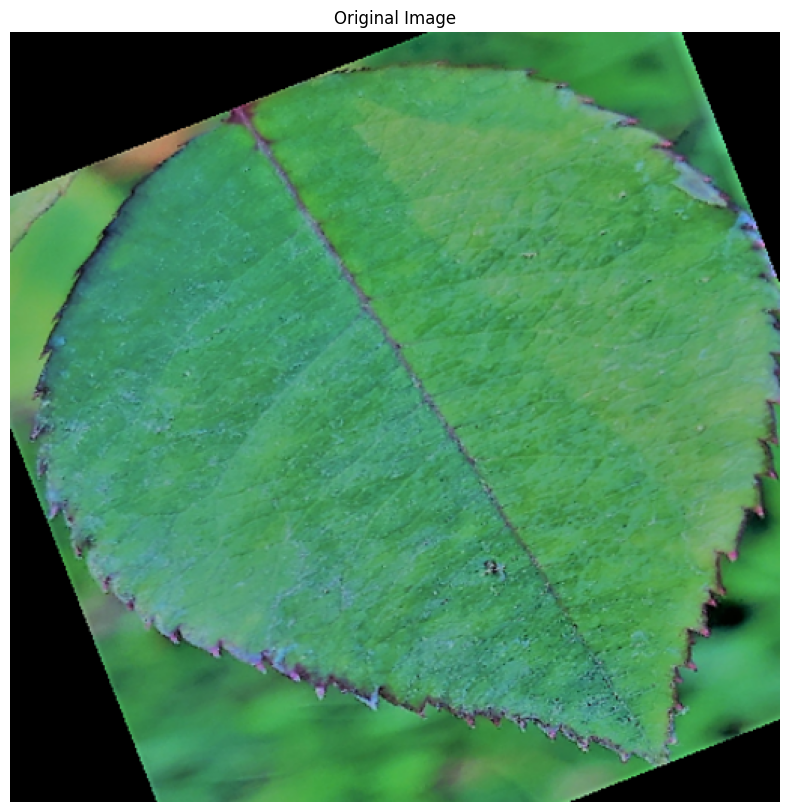

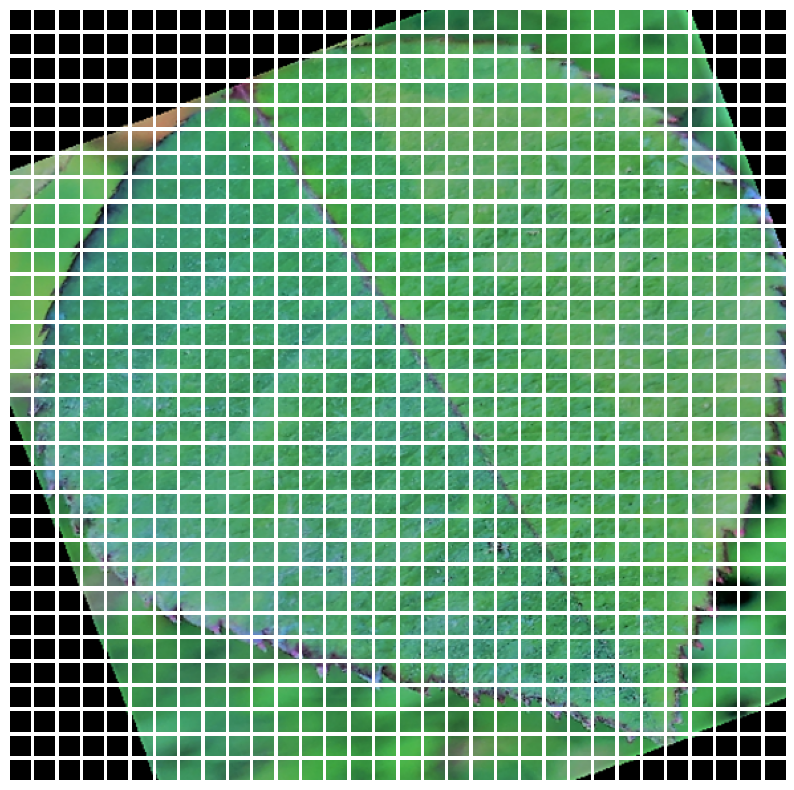

Unexpected embedding dimension: 1000. Adjust visualization accordingly.
Attention maps not available or not directly accessible.


In [66]:
import torch
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
from torchvision import transforms
from torchvision.models import vit_b_16

def extract_patches(image, patch_size):
    """Extract patches from the image."""
    image = np.array(image)
    patches = []
    for i in range(0, image.shape[0], patch_size):
        for j in range(0, image.shape[1], patch_size):
            patch = image[i:i + patch_size, j:j + patch_size]
            if patch.shape[0] == patch_size and patch.shape[1] == patch_size:
                patches.append(patch)
    return patches

def visualize_patches(patches):
    """Visualize the extracted patches."""
    num_patches = len(patches)
    grid_size = int(np.ceil(np.sqrt(num_patches)))
    fig, axes = plt.subplots(grid_size, grid_size, figsize=(10, 10))
    
    for ax, patch in zip(axes.flatten(), patches):
        ax.imshow(patch)
        ax.axis('off')
    
    # Turn off axes for any empty subplots
    for i in range(num_patches, grid_size * grid_size):
        axes.flatten()[i].axis('off')
    
    plt.show()

def visualize_vit_steps(model, image_path, preprocess, device):
    # Load and preprocess the image
    image = Image.open(image_path).convert('RGB')
    input_image = preprocess(image).unsqueeze(0).to(device)
    
    # Show original image
    plt.figure(figsize=(10, 10))
    plt.imshow(image)
    plt.title("Original Image")
    plt.axis('off')
    plt.show()
    
    # Parameters for Vision Transformer
    patch_size = 16  # For ViT-B/16, each patch is 16x16 pixels
    image_size = (224, 224)  # Adjust based on your ViT model input size
    
    # Extract and visualize patches
    patches = extract_patches(image, patch_size)
    visualize_patches(patches)
    
    # Model forward pass to get outputs
    model.eval()
    with torch.no_grad():
        outputs = model(input_image)
    
    # Extract embeddings from model output
    # Adjust this based on the specific output of your ViT model
    try:
        hidden_states = outputs.last_hidden_state
        patch_embeddings = hidden_states[0, 1:, :]  # Assuming hidden_states has this shape
    except AttributeError:
        hidden_states = outputs
        patch_embeddings = hidden_states
    
    # Visualize patch embeddings
    num_patches = patch_embeddings.size(0)
    dim = patch_embeddings.size(-1)
    # For visualization, we might need to reduce dimensions
    if dim == 768:  # Typical embedding size for ViT-B/16
        # Plot embeddings using a 2D scatter plot
        plt.figure(figsize=(15, 15))
        plt.scatter(patch_embeddings[:, 0].cpu().numpy(), patch_embeddings[:, 1].cpu().numpy(), s=10)
        plt.title('Patch Embeddings Visualization')
        plt.xlabel('Embedding Dimension 1')
        plt.ylabel('Embedding Dimension 2')
        plt.show()
    else:
        print(f"Unexpected embedding dimension: {dim}. Adjust visualization accordingly.")
    
    # Visualize attention maps (if applicable)
    try:
        attention_maps = outputs.attentions  # Example; adjust based on model specifics
        for i, attn_map in enumerate(attention_maps):
            plt.figure(figsize=(10, 10))
            plt.imshow(attn_map[0].cpu().numpy(), cmap='viridis')
            plt.title(f'Attention Map {i + 1}')
            plt.colorbar()
            plt.show()
    except AttributeError:
        print("Attention maps not available or not directly accessible.")

# Example usage:
custom_image_path = "3.png"
preprocess = transforms.Compose([
    transforms.Resize((224, 224)),  # Adjust size based on your ViT model
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Pretrained model normalization
])

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
pretrained_vit = vit_b_16(pretrained=True).to(device)  # Replace with your model
visualize_vit_steps(model=pretrained_vit, image_path=custom_image_path, preprocess=preprocess, device=device)


In [67]:
!pip install torch torchvision matplotlib



[notice] A new release of pip is available: 23.2.1 -> 24.2
[notice] To update, run: C:\Users\ARIF\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

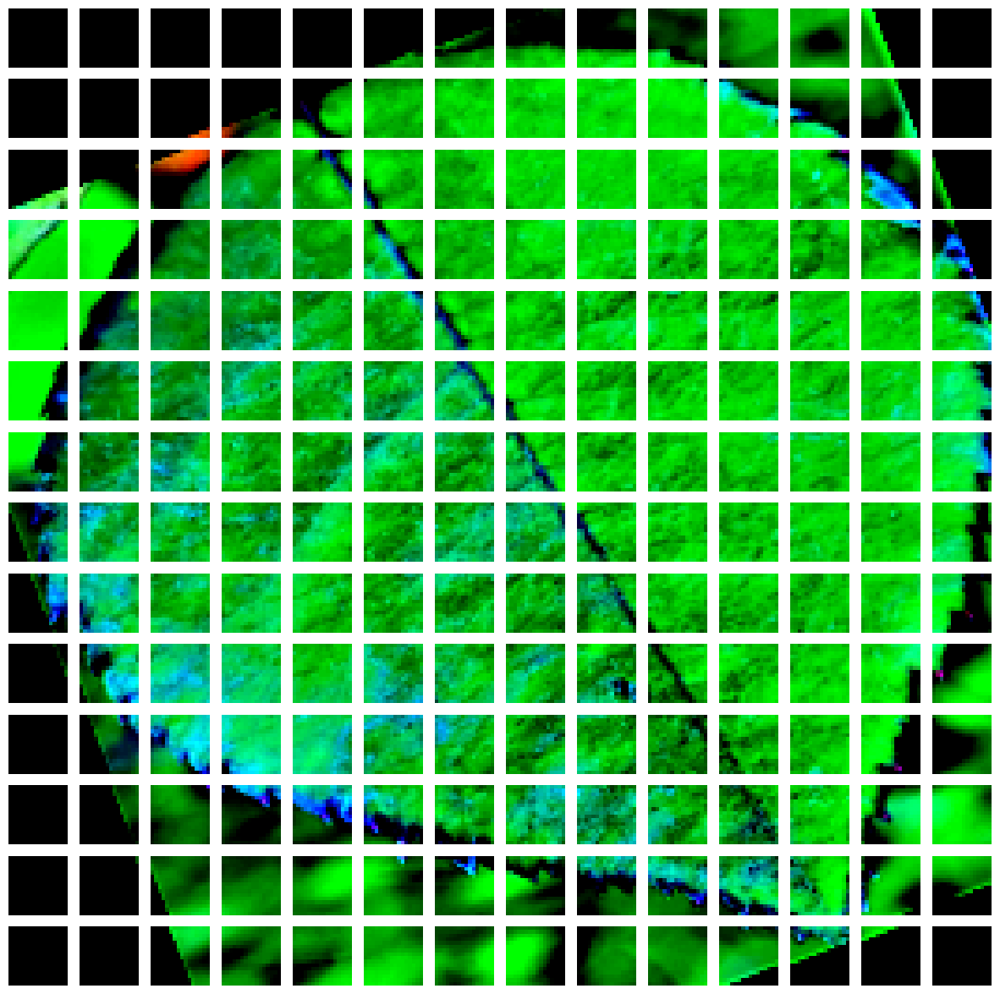

Attention map visualization is not implemented. You need to use model hooks or modify the model to get this.
Patch embedding visualization is not implemented. You need to use model hooks or modify the model to get this.
Visualizations completed.


In [70]:
import torch
import matplotlib.pyplot as plt
from torchvision import transforms
from PIL import Image
from torchvision.models import vit_b_16
import numpy as np

# Function to preprocess the image
def preprocess_image(image_path, preprocess):
    image = Image.open(image_path).convert('RGB')
    return preprocess(image).unsqueeze(0)

# Function to visualize image patches
def visualize_patches(image_path, preprocess, patch_size=16):
    # Load and preprocess the image
    img_tensor = preprocess_image(image_path, preprocess).squeeze(0).permute(1, 2, 0).cpu().numpy()
    height, width, _ = img_tensor.shape

    num_patches_h = height // patch_size
    num_patches_w = width // patch_size

    patches = []
    for i in range(num_patches_h):
        for j in range(num_patches_w):
            patch = img_tensor[i*patch_size:(i+1)*patch_size, j*patch_size:(j+1)*patch_size]
            patches.append(patch)

    # Plot patches
    plt.figure(figsize=(15, 15))
    for i, patch in enumerate(patches):
        plt.subplot(num_patches_h, num_patches_w, i + 1)
        plt.imshow(patch)
        plt.axis('off')
    plt.show()

# Function to visualize attention maps (requires model hooks)
def visualize_attention_maps(model, image_path, preprocess, device):
    # Implement attention map extraction using model hooks (not included here)
    # For demonstration, we will print a placeholder message
    print("Attention map visualization is not implemented. You need to use model hooks or modify the model to get this.")

# Function to visualize patch embeddings (requires model hooks)
def visualize_patch_embeddings(model, image_path, preprocess, device):
    # Implement patch embedding extraction using model hooks (not included here)
    # For demonstration, we will print a placeholder message
    print("Patch embedding visualization is not implemented. You need to use model hooks or modify the model to get this.")

def visualize_vit_steps(model, image_path, preprocess, device):
    # Visualize patches from the input image
    visualize_patches(image_path, preprocess)
    
    # Visualize attention maps (requires model modifications or hooks)
    visualize_attention_maps(model, image_path, preprocess, device)
    
    # Visualize patch embeddings (requires model modifications or hooks)
    visualize_patch_embeddings(model, image_path, preprocess, device)

    print("Visualizations completed.")

# Define preprocessing steps for the ViT model
preprocess = transforms.Compose([
    transforms.Resize((224, 224)),  # Adjust size based on your ViT model
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Setup model and device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
pretrained_vit = vit_b_16(pretrained=True).to(device)

# Custom image path
custom_image_path = "3.png"

# Visualize all steps
visualize_vit_steps(model=pretrained_vit, image_path=custom_image_path, preprocess=preprocess, device=device)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

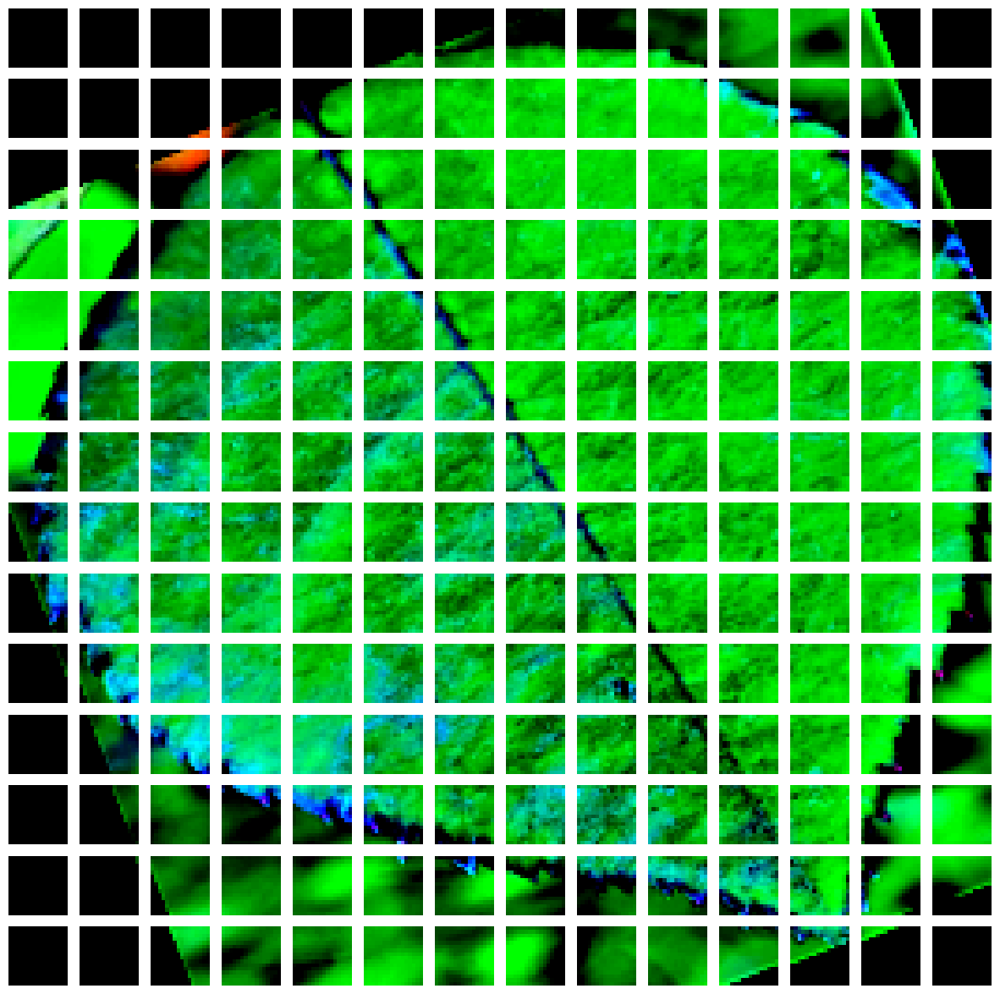

Visualizations completed.


In [71]:
import torch
import matplotlib.pyplot as plt
from torchvision import transforms
from PIL import Image
from torchvision.models import vit_b_16
import numpy as np

def preprocess_image(image_path, preprocess):
    image = Image.open(image_path).convert('RGB')
    return preprocess(image).unsqueeze(0)

def visualize_patches(image_path, preprocess):
    # Load and preprocess the image
    image = Image.open(image_path).convert('RGB')
    img_tensor = preprocess_image(image_path, preprocess).squeeze(0).permute(1, 2, 0).cpu().numpy()
    
    patch_size = 16  # Adjust according to ViT model patch size
    height, width, _ = img_tensor.shape

    # Calculate number of patches along height and width
    num_patches_h = height // patch_size
    num_patches_w = width // patch_size

    # Initialize an empty list to hold patches
    patches = []

    for i in range(num_patches_h):
        for j in range(num_patches_w):
            patch = img_tensor[i*patch_size:(i+1)*patch_size, j*patch_size:(j+1)*patch_size]
            patches.append(patch)

    # Plot patches
    plt.figure(figsize=(15, 15))
    for i, patch in enumerate(patches):
        plt.subplot(num_patches_h, num_patches_w, i + 1)
        plt.imshow(patch)
        plt.axis('off')
    plt.show()

def visualize_vit_steps(model, image_path, preprocess, device):
    # Preprocess and prepare the image
    input_image = preprocess_image(image_path, preprocess).to(device)
    
    # Forward pass to get outputs
    model.eval()
    with torch.no_grad():
        outputs = model(input_image)

    # Visualize patches from the input image
    visualize_patches(image_path, preprocess)
    
    # Visualizing attention maps and embeddings would require extracting them from the model
    # This part needs implementing hooks or adjustments in the model to extract and visualize

    print("Visualizations completed.")

# Define preprocessing steps for the ViT model
preprocess = transforms.Compose([
    transforms.Resize((224, 224)),  # Adjust size based on your ViT model
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Setup model and device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
pretrained_vit = vit_b_16(pretrained=True).to(device)

# Custom image path
custom_image_path = "3.png"

# Visualize all steps
visualize_vit_steps(model=pretrained_vit, image_path=custom_image_path, preprocess=preprocess, device=device)
